### Obsolete

In [8]:
from urllib.request import urlopen, Request
import folium
import folium.plugins
from geopy.geocoders import Nominatim

In [3]:
# pip install beautifulsoup4
from bs4 import BeautifulSoup

In [174]:
url = 'https://www.sportscheck.com/filialen/'
url

'https://www.sportscheck.com/filialen/'

In [387]:
def get_dict_branches(url:str, selected_row:int, logging:bool= False) -> dict:
    page = urlopen(url)
    html = page.read().decode("utf-8")
    soup = BeautifulSoup(html, 'html.parser')
    print(soup.find('h2').get_text())

    className = 'landingpage-text__inner landingpage-text--centered'
    results = soup.find_all('div', {'class': className})

    tag = results[selected_row]
    l_branches = tag.find_all('a')

    l_links = [branch.get('href') for branch in l_branches]
    l_cities = [branch.text for branch in l_branches]
    
    if logging: # l_links
        print(f'length l_links={len(l_links)}')
        print(f'length l_cities={len(l_cities)}')

    output = {}
    for key, value in zip(l_links, l_cities):
        output.setdefault(key, []).append(value)
    
    if logging:
        print(output)
    return output

In [690]:
url = 'https://www.sportscheck.com/filialen/'
output = get_dict_branches(url,1)
print(len(output))
output

SPORTSCHECK FILIALEN 
30


{'https://www.sportscheck.com/filialen/aachen/': ['Aachen'],
 'https://www.sportscheck.com/filialen/berlin-schoeneberg/': ['Berlin-Schöneberg',
  ''],
 'https://www.sportscheck.com/filialen/berlin-steglitz/': ['Berlin-Steglitz'],
 'https://www.sportscheck.com/filialen/bielefeld/': ['Bielefeld', '', ''],
 'https://www.sportscheck.com/filialen/bonn/': ['Bonn'],
 'https://www.sportscheck.com/filialen/braunschweig/': ['Braunschweig'],
 'https://www.sportscheck.com/filialen/bremen/': [''],
 'https://www.sportscheck.com/filialen/dortmund/': ['Dortmund'],
 'https://www.sportscheck.com/filialen/dresden-centrum-galerie/': ['',
  'Dresden Centrum-Galerie'],
 'https://www.sportscheck.com/filialen/dresden-altmarkt-galerie/': ['Dresden\xa0Altmarkt-Galerie',
  '',
  ''],
 'https://www.sportscheck.com/filialen/erfurt/': ['Erfurt'],
 'https://www.sportscheck.com/filialen/frankfurt/': ['Frankfurt', ''],
 'https://www.sportscheck.com/filialen/goettingen/': ['Göttingen'],
 'https://www.sportscheck.com/fi

In [688]:
output = {
'https://www.sportscheck.com/filialen/hamburg-altstadt/': ['Hamburg-Altstadt', '']
#     # 'https://www.sportscheck.com/filialen/koeln/': ['Köln'],
#     # 'https://www.sportscheck.com/filialen/moenchengladbach/': ['Mönchengladbach'],
# #  'https://www.sportscheck.com/filialen/muenchen/': [''],
# #  'https://www.sportscheck.com/filialen/muenster/': ['Münster'],
# #  'https://www.sportscheck.com/filialen/nuernberg/': ['Nürnberg'],
#  'https://www.sportscheck.com/filialen/stuttgart/': ['Stuttgart', ''],
# #  'https://www.sportscheck.com/filialen/wildau/': ['Wildau']
}

i=0/29, key=https://www.sportscheck.com/filialen/aachen/, value=['Aachen']
Found mall=Aquis Plaza
address=Adalbertstraße 100 52062 Aachen
  1.location_with_address=Aquis Plaza, 100, Adalbertstraße, Kaiserplatz, Burtscheid, Aachen-Mitte, Aachen, Städteregion Aachen, Nordrhein-Westfalen, 52062, Deutschland
elem=Aachen
url=https://www.sportscheck.com/filialen/
location=Aquis Plaza, 100, Adalbertstraße, Kaiserplatz, Burtscheid, Aachen-Mitte, Aachen, Städteregion Aachen, Nordrhein-Westfalen, 52062, Deutschland
  3.location_with_address=Aquis Plaza, 100, Adalbertstraße, Kaiserplatz, Burtscheid, Aachen-Mitte, Aachen, Städteregion Aachen, Nordrhein-Westfalen, 52062, Deutschland

i=1/29, key=https://www.sportscheck.com/filialen/berlin-schoeneberg/, value=['Berlin-Schöneberg', '']
address=Tauentzienstraße 5  10789 Berlin
  1.location_with_address=Dörfer Kieferorthopädie, 5, Tauentzienstraße, Schöneberg, Tempelhof-Schöneberg, Berlin, 10789, Deutschland
elem=Berlin-Schöneberg
url=https://www.sport


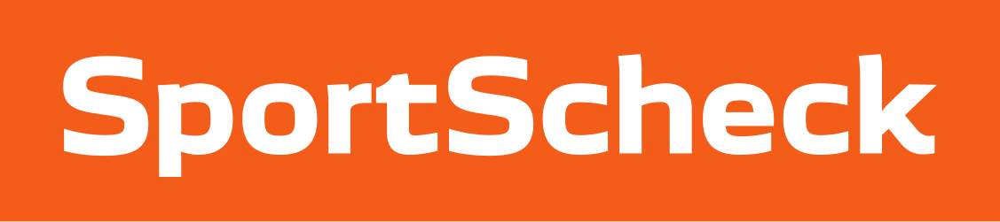
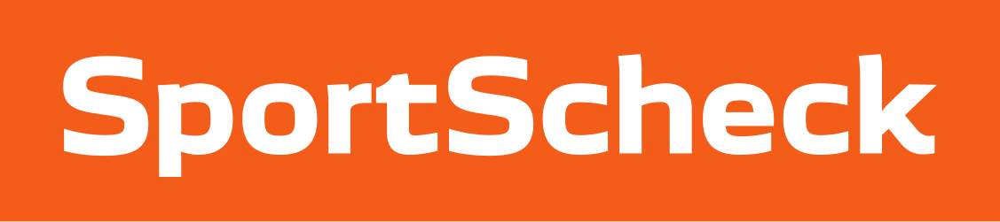
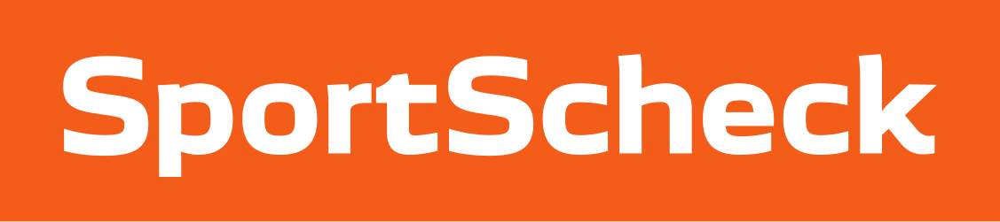
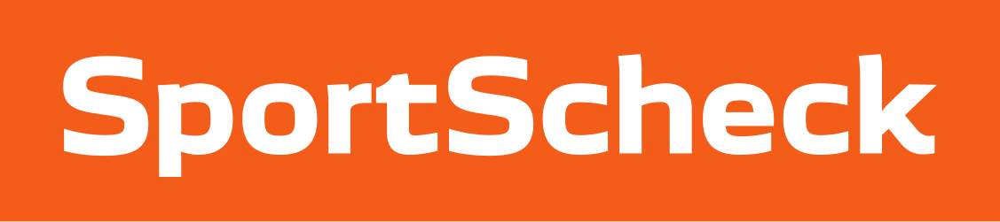
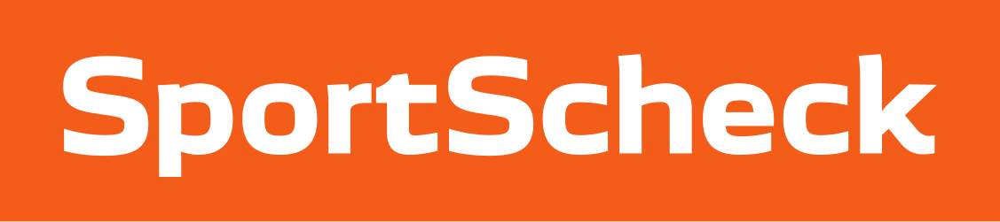
...
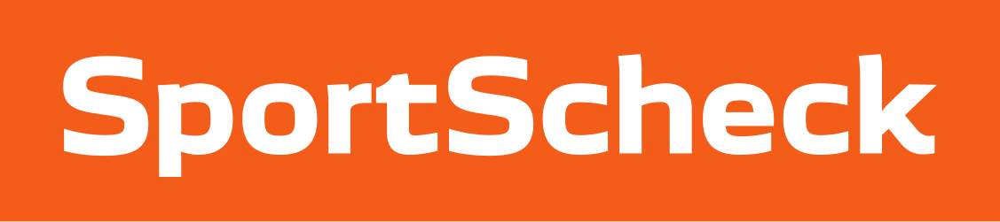
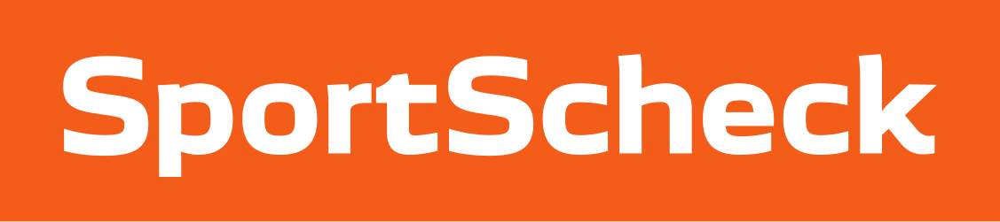
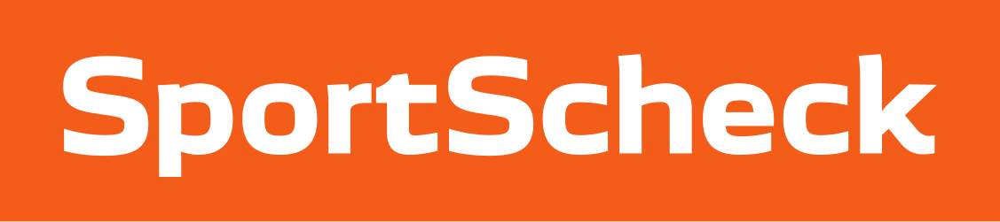
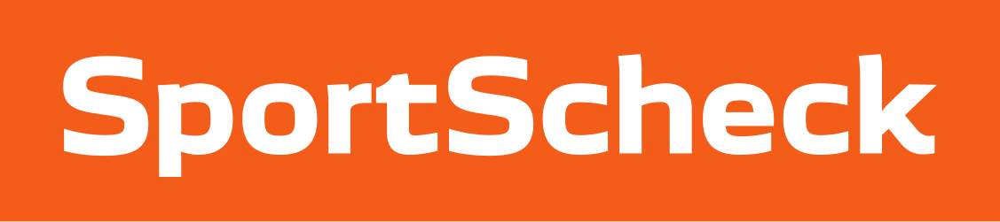
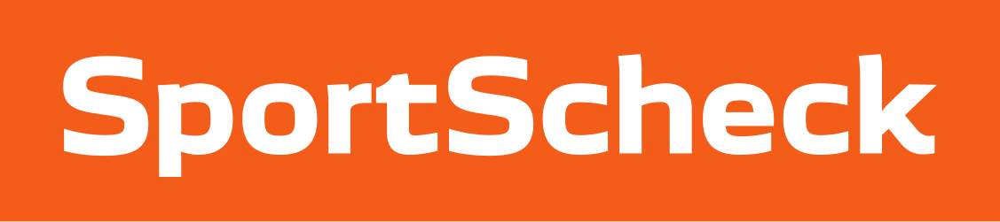

In [346]:
url2 = list(output.keys())[0]
print(f'url={url2}') 

rect = get_info_branch(url2,1)
map = folium.Map(max_zoom=18)
map.add_chil(rect)


url=https://www.sportscheck.com/filialen/aachen/
<class 'bs4.element.ResultSet'>
<class 'bs4.element.Tag'>


In [237]:
tag.find_all('p')

[<p>Montag - Freitag: 11:00 - 19:00 Uhr<br/>Samstag: 11:00 - 20:00 Uhr </p>,
 <p> </p>,
 <p>SportScheck Aachen</p>,
 <p>Aquis Plaza</p>,
 <p>Adalbertstraße 100</p>,
 <p>52062 Aachen</p>,
 <p>Mail: <span style="text-decoration: underline;">service@sportscheck.com</span></p>,
 <p> </p>,
 <p><span style="text-decoration: underline;"><a href="https://www.sportscheck.com/filialen/"><span style="font-family: Intro; font-size: 18.0pt;">zur Filialübersicht</span></a></span></p>]

In [239]:
print(tag.text)

ÖFFNUNGSZEITEN
Montag - Freitag: 11:00 - 19:00 UhrSamstag: 11:00 - 20:00 Uhr 
 
KONTAKT
SportScheck Aachen
Aquis Plaza
Adalbertstraße 100
52062 Aachen
Mail: service@sportscheck.com
 
zur Filialübersicht


In [337]:
s2

['ÖFFNUNGSZEITEN',
 'Montag - Freitag: 11:00 - 19:00 UhrSamstag: 11:00 - 20:00 Uhr\xa0',
 'KONTAKT',
 'SportScheck Aachen',
 'Aquis Plaza',
 'Adalbertstraße 100',
 '52062 Aachen',
 'Mail: service@sportscheck.com',
 '\xa0',
 'zur Filialübersicht']

In [341]:
" ".join(s2[4:7])

'Aquis Plaza Adalbertstraße 100 52062 Aachen'

In [276]:
locator = Nominatim(user_agent="google") # https://github.com/geopy/geopy/tree/master/geopy/geocoders
location = locator.geocode(f"{address} {city} {country}", language='English')
    # def geocode(
    #         self,
    #         query=None,
    #         *,
    #         exactly_one=True,
    #         timeout=DEFAULT_SENTINEL,
    #         bounds=None,
    #         region=None,
    #         components=None,
    #         place_id=None,
    #         language=None,
    #         sensor=False
    # ):
location
# print("Latitude = {}, Longitude = {}".format(location.latitude, location.longitude))

Location(Aquis Plaza, 100, Adalbertstraße, Kaiserplatz, Burtscheid, Aachen-Mitte, Aachen, Städteregion Aachen, Nordrhein-Westfalen, 52062, Deutschland, (50.77473085, 6.093145491143544, 0.0))

In [295]:
print(location.address)
# https://www.openstreetmap.org/way/31252157#map=18/50.774973/6.093217

Aquis Plaza, 100, Adalbertstraße, Kaiserplatz, Burtscheid, Aachen-Mitte, Aachen, Städteregion Aachen, Nordrhein-Westfalen, 52062, Deutschland


In [290]:
def print_members_accessible(location):
    return [i for i in dir(location) if not i[0].startswith('_')]
members = print_members_accessible(location)
members

['address', 'altitude', 'latitude', 'longitude', 'point', 'raw']

In [328]:
# pip install ogr
# pip install wget

In [297]:

location = locator.geocode(f"{address}, {city}, {country}")
location.raw

# NODES: Nodes are objects with a position (coordinates). Nodes can represent a postbox, tree, subway entrance, city center, building number, etc
# WAYS:  A way is a line or polygon, for example, for streets, rivers, buildings, or boundaries.
# RELATIONS: Relations are groups of nodes, ways and possibly other relations that describe some structure in the world 
          # (e.g., the relation "cycleway" describes the structure of a bicycle path alongside a road)

{'place_id': 132715081,
 'licence': 'Data © OpenStreetMap contributors, ODbL 1.0. http://osm.org/copyright',
 'osm_type': 'way',
 'osm_id': 31252157,
 'lat': '50.77473085',
 'lon': '6.093145491143544',
 'class': 'shop',
 'type': 'mall',
 'place_rank': 30,
 'importance': 0.1580839831692664,
 'addresstype': 'shop',
 'name': 'Aquis Plaza',
 'display_name': 'Aquis Plaza, 100, Adalbertstraße, Kaiserplatz, Burtscheid, Aachen-Mitte, Aachen, Städteregion Aachen, Nordrhein-Westfalen, 52062, Deutschland',
 'boundingbox': ['50.7741604', '50.7752769', '6.0914492', '6.0945287']}

In [438]:
location.raw#['boundingbox']

{'place_id': 132715081,
 'licence': 'Data © OpenStreetMap contributors, ODbL 1.0. http://osm.org/copyright',
 'osm_type': 'way',
 'osm_id': 31252157,
 'lat': '50.77473085',
 'lon': '6.093145491143544',
 'class': 'shop',
 'type': 'mall',
 'place_rank': 30,
 'importance': 0.1580839831692664,
 'addresstype': 'shop',
 'name': 'Aquis Plaza',
 'display_name': 'Aquis Plaza, 100, Adalbertstraße, Kaiserplatz, Burtscheid, Aachen-Mitte, Aachen, Städteregion Aachen, Nordrhein-Westfalen, 52062, Deutschland',
 'boundingbox': ['50.7741604', '50.7752769', '6.0914492', '6.0945287']}

In [327]:
map = folium.Map(max_zoom=18)
# map
points = [[location.raw['boundingbox'][0],location.raw['boundingbox'][2]],[location.raw['boundingbox'][1],location.raw['boundingbox'][3]]]
map.fit_bounds(points)

folium.Rectangle(bounds=points, color='#ff7800', fill=True, fill_color='#ffff00', fill_opacity=0.2).add_to(map)
map

### FUNCTIONALITY

In [1]:
# def find_index(lis:list, substring:str):
#     indices = [i for i, element in enumerate(lis) if substring in element.lower()]
#     if indices:
#         # print(f"Found '{substring}' at indices {indices}")
#         return indices[0]
#     else:
#         # print(f"'{substring}' not found in the list")
#         return -1

# def get_info_branch(it:int, branch_url:str, location_city:str, selected_row:int, logging:bool= False) :
#     page = urlopen(branch_url)
#     html = page.read().decode("utf-8")
#     soup = BeautifulSoup(html, 'html.parser')
#     if logging:
#         print(soup.find('h2').get_text())
    
#     className = 'landingpage-text__inner landingpage-text--centered'
#     results = soup.find_all('div', {'class': className})
#     # print(type(results))
#     tag = results[selected_row]
#     # print(type(tag))
#     if logging:
#         print(tag.text)
#     s2=tag.text.split('\n')
#     s2.remove('\xa0')

#     # print(f's2={s2}')
    
#     idx_start = find_index(s2,'sportscheck')
#     end_row = find_index(s2,'mail')

#     if idx_start==-1:
#         print(f'Invalid start_row={idx_start}')
#         return None,None,None
#     if end_row == -1:
#         print(f'Invalid end_row={start_row}')
#         return [None,None,None]

#     start_row = idx_start + 1
#     address = " ".join(s2[start_row:end_row])
        
#     sub_str = ['shopping','center','mall','plaza']
#     if any(x in s2[start_row].lower() for x in sub_str):
#         print(f'Found mall={s2[start_row]}')
#         start_row = start_row + 1
        
    
#     # print(f'start_row:{start_row}')
#     # print(f'end_row:{end_row}')
        
#     address = " ".join(s2[start_row:end_row])
    
#     if 'sss' in address:
#         address = address.replace("sss", "ss")
#         print(f'sss={s2[start_row]}')
#     print(f'address={address}')
    
#     locator = Nominatim(user_agent="google") # https://github.com/geopy/geopy/tree/master/geopy/geocoders
#     location_with_address = locator.geocode(address)
#     print(f'  1.location_with_address={location_with_address}')
    
#     # print(f'location:{location}')

#     location_with_osm = None
#     for elem in location_city:
#         if elem:
#             print(f'elem={elem}')
#             osm_address = f'SportScheck {elem}'
#             location_with_osm = locator.geocode(osm_address)
#             if location_with_osm is not None:
#                 print(f'location_with_osm={location_with_osm}')
#                 print(f'Found directly the SportScheck in {elem}')
#                 continue

#     if location_with_address is None:
#         print(f'location_with_address invalid={address}')
#         location = location_with_osm
#     else:
#         location = location_with_address

#     if location is None:
#         print('No Location whatsoever')
#         return [None,None,None]
    
#     print(f'url={url}')
#     print(f'location={location}')
    
#     link = f'''<a href={branch_url}>{branch_url}</a>'''

#     l_fg_address = folium.FeatureGroup(name=f'[#{it}] SportScheck {location_city}/Address')    
#     if location_with_address is not None:
#         print(f'  3.location_with_address={location_with_address}')
#         points = [[location_with_address.raw['boundingbox'][0],location_with_address.raw['boundingbox'][2]],[location_with_address.raw['boundingbox'][1],location_with_address.raw['boundingbox'][3]]]
#         rect = folium.Rectangle(bounds=points, color='#ff7800', fill=True, fill_color='#ffff00', fill_opacity=0.2, 
#                                 tooltip=location_with_address.address,
#                                 popup=link)
#         l_fg_address.add_child(rect)

    
#     l_fg_osm = folium.FeatureGroup(name=f'[#{it}] SportScheck {location_city}/OSM')
#     if location_with_osm is not None:
#         print(f'  2.location_with_osm={location_with_osm}')
#         points = [[location_with_osm.raw['boundingbox'][0],location_with_osm.raw['boundingbox'][2]],[location_with_osm.raw['boundingbox'][1],location_with_osm.raw['boundingbox'][3]]]
#         rect_with_city = folium.Rectangle(bounds=points, color='blue', fill=True, fill_color='#ffff00', fill_opacity=0.2, 
#                         tooltip=location_with_osm.address,
#                         popup=link)
#         l_fg_osm.add_child(rect_with_city)
        
    
#     l_fg_marker = folium.FeatureGroup(name=f'[#{it}] SportScheck {location_city}/Marker')
#     marker = folium.Marker(location=[location.raw['lat'], location.raw["lon"]],
#                               tooltip=location.address,
#                               popup=link,
#                               icon=folium.features.CustomIcon(icon_image='assets/SportScheck/1_Home/logo.png',
#                                                               icon_size=(50, 15)
#                                                              )
#                               )
#     l_fg_marker.add_child(marker)

#     return [l_fg_osm,l_fg_address,l_fg_marker]

In [7]:
%pip install selenium
%pip install BeautifulSoup4 requests
%pip install Nominatim

Note: you may need to restart the kernel to use updated packages.



In [37]:
import time

from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC

from urllib.request import urlopen, Request
import folium
import folium.plugins

def extract_html_soup(url:str, 
                      header:dict = {'User-Agent': 'Mozilla/5.0 (Windows NT 6.1) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/41.0.2228.0 Safari/537.3'},
                      isWaitNeeded:bool = False,
                      is_logging:bool=False
                      ):
    print(f' Extracting soup from url [{url}]')
    req = Request(url=url, headers=header)
    if(is_logging):
      print(f'Requests [{req}] with headers [{header}]!')

    if isWaitNeeded:
      
      driver = webdriver.Chrome()
      driver.get('https://www.intersport.de/d/stores')
      wait = WebDriverWait(driver, 100)
      time.sleep(2)
      str_text = driver.page_source
      soup = BeautifulSoup(str_text, 'html.parser')
      driver.quit()
    else:
      resource = urlopen(req).read()
      if(is_logging):
        print(f'URL [{url}] opened!')

      content = resource.decode("utf-8")
      if(is_logging):
        print('Content decoded!')

      soup = BeautifulSoup(content, 'html.parser')
    return soup

In [38]:
from bs4 import BeautifulSoup

def write_soup_to_file(soup:BeautifulSoup, filename:str):
    with open(f'{filename}.html', "w", encoding='utf-8') as f:
        f.write(str(soup.prettify()))
    print(f'File [{filename}.html] written!, length={len(str(soup))}')

In [39]:
def extract_info_sportscheck_stores(dict_store:dict, is_log:bool=False):

    for i,(store_id, store_info) in enumerate(dict_store.items()):
        print(f' [{i}/{len(dict_store)}] url={store_info['url']}')
        name = store_info['url'].split('/')[-2]
        dict_store[store_id]['name'] = name
        dict_store[store_id]['active'] = False
        dict_store[store_id]['address'] = 'None'

        try:
            html = urlopen(store_info['url']).read().decode("utf-8")
            soup = BeautifulSoup(html, 'html.parser')
            print(' Store Soup is ready!')
        
            kontakt_tag = soup.find('h2', string=lambda text: text and 'KONTAKT' in text)
            if kontakt_tag:
                kontakt_info = kontakt_tag.find_next_siblings('p')
                kontakt_details = [info.text.strip() for info in kontakt_info]
            else:
                kontakt_details = []

            if not kontakt_details:
                dict_store[store_id]['active'] = False
                print(f' This STORES IS CLOSED!!!')
                continue
            kontakt_details = [s for s in kontakt_details if s.strip()]
            lines_to_remove = ['Mail','Filial','Hier','Galerie','Ecke']
            kontakt_details = [s for s in kontakt_details if not any(word in s for word in lines_to_remove)]
            if is_log:
                print(f' kontakt_details={kontakt_details}')
            
            
            address1 = ' '.join(kontakt_details[1:-1])
            address = ', '.join([address1,kontakt_details[-1]])
            
            # Quick and dirty fix for koeln
            if(name == 'koeln'):
                address = 'Schildergasse 38 - 42, 50667 Köln'
            dict_store[store_id]['address'] = address
            dict_store[store_id]['active'] = True
        except Exception as e:            
            print(f"Error fetching {store_info['url']}: {e}")
            print(f' This STORES IS CLOSED!!!')

        finally:           
            if is_log:
                    print(f'  name={dict_store[store_id]['name']}\n  \
                          address={dict_store[store_id]['address']}\n  \
                            active={dict_store[store_id]['active']}\n')

In [40]:
def extract_stores_from_soup(soup:BeautifulSoup,
                             store_name:str,
                             is_logging:bool = False
                             ) -> dict:
    print(f'  Extracting stores from soup!')
    
    # Find all the store names and addresses
    stores = []
    if (store_name == 'SportScheck'):
        # Extract URLs containing the specified string
        urls = []
        for a_tag in soup.find_all('a', href=True):
            href = a_tag['href']
            if 'www.sportscheck.com/filialen' in href:
                urls.append(href)

        # Remove duplicates by converting to a set and back to a list
        urls = list(set(urls))

        # Remove the default path appearance
        if 'https://www.sportscheck.com/filialen/' in urls:
            urls.remove('https://www.sportscheck.com/filialen/')
        
        dict_stores = {i: {'url': url} for i, url in enumerate(sorted(urls), start=1)}
        
        extract_info_sportscheck_stores(dict_store=dict_stores, is_log=is_logging)


    elif (store_name == 'Decathlon'):
        for store in soup.find_all('div', class_='store-details'):
            name = store.find('div', class_='store-details__name').find('h2', class_='subtitle-m').text.strip()
            number = store.find('div', class_='store-details__link').find('a', href=True)['href'].split('-')[-1]
            # print(f'number={number}')
            address = store.find('div', class_='store-details__address').find('div', class_='store-locator__address-caption').text.strip()
            # href = store.find('a', href=True)['href']
            # number = href.split('/store-view/filiale-')[1].split('-')[-1]
            stores.append({'name': name, 'address': address,  'number':number})

        # Print the extracted store names and addresses
        for store in stores:
            if(is_logging):
                print(f"Number: {store['number']}\t, Name: {store['name']}\t, Address: {store['address']}")

        print(f'Number of stores:{len(stores)}')

        # Convert the list of stores to a dictionary with 'number' as the key
        dict_stores = {store['number']: {'name': store['name'], 'address': store['address']} for store in stores}
        
    elif(store_name == 'Intersport'):
        store_elements = soup.find_all('a', class_='_disc_store_s4ohB')
        for store_element in store_elements:
            try:
                name = store_element.find('h3').text.strip()
                name_full = store_element.get('href').split('/')[-1]
                id = name_full.split('-')[0]
                url = store_element.get('href')
                address = store_element.find('p', id=lambda x: x and x.endswith('-street')).text.strip()
                postal_code = store_element.find('p', id=lambda x: x and x.endswith('-postalCode')).text.strip()
                address = address + ', ' + postal_code
                stores.append({'id' : id, 'name': name_full, 
                            'url': url,
                            'address': address, 
                            'postal_code': postal_code})
            except AttributeError as e:
                print(f"Error extracting store details: {e}")

        # Print the extracted store names and addresses
        for store in stores:
            if(is_logging):
                print(f"id: {store['id']}\t,  \
                    Name: {store['name']}\t, \
                    Address: {store['address']}")

        print(f'Number of stores:{len(stores)}')

        # Convert the list of stores to a dictionary with 'number' as the key
        dict_stores = {store['id']: {'name': store['name'], 
                                    'address': store['address'],
                                    'url' : store['url']
                                    } for store in stores}
    
    return dict_stores

In [41]:
from geopy.exc import GeocoderTimedOut
from geopy.geocoders import Nominatim

def enrich_dict_stores(d_stores:dict, 
                        path_logo:str,
                    #    geolocator = Nominatim(user_agent="store_locator", timeout=10)
                        geolocator:Nominatim = Nominatim(user_agent="google", timeout=10),
                        tuple_icon_size:tuple=(40,10),
                        is_logging:bool=False
) :

    for i, (store_id,store_info) in enumerate(d_stores.items()):
        if(is_logging):
            print(f'[{i}/{len(d_stores)}, store_id={store_id}]')

        # for i in range(retries):
        #     try:
        #         location_store = geolocator.geocode(store_info['address'])
        #     if location:
        #         is_store_located = True
        #         continue
        #     except GeocoderTimedOut:
        #         print(f"Timeout error. Retrying... ({i+1}/{retries})")
        #         time.sleep(2)
            
        # if is_store_located:
        location_store = geolocator.geocode(store_info['address'])
        if location_store is not None:
            d_stores[store_id]['location'] = location_store
            d_stores[store_id]['lat'] = location_store.raw['lat']
            d_stores[store_id]['lon'] = location_store.raw['lon']
            location_bbox = location_store.raw['boundingbox']

            l_fg_address = folium.FeatureGroup(name=f'[{store_id}/{store_info['name']}')
            if(is_logging):
                print(f'Location coord=[{location_store.raw['lat'], location_store.raw["lon"]}]')
            if location_store is not None:
                points = [[location_bbox[0],location_bbox[2]],[location_bbox[1],location_bbox[3]]]
                rect = folium.Rectangle(bounds=points, color='#ff7800', fill=True, 
                                        fill_color='#ffff00', fill_opacity=0.2, 
                                        tooltip=location_store.address,
                                        # popup=link
                                        )
                d_stores[store_id]['rect'] = rect
                l_fg_address.add_child(rect)
                marker = folium.Marker(location=[location_store.raw['lat'], location_store.raw["lon"]],
                                    tooltip=f'Store={store_id}\nAddress={location_store.address}',
                                    # popup=link,
                                    icon=folium.features.CustomIcon(icon_image=path_logo,
                                                                    icon_size=tuple_icon_size
                                                                    )
                                    )
                d_stores[store_id]['marker'] = marker
                l_fg_address.add_child(marker)
                d_stores[store_id]['fg'] = l_fg_address
        else:
            print(f'[{i}/{len(d_stores)}, store_id={store_id}] Address could not be found! NO coordinates!')

In [43]:
import folium
import folium.plugins

def gen_map_stores(d_stores:dict,
                   is_logging:bool=False
                   ) -> folium.Map():
    fm=folium.Map()
    for i, (store_id,store_info) in enumerate(d_stores.items()):
        if(is_logging):
            print(f'[{i}/{len(d_stores)}, store_id={store_id}]')
            print(f'keys={store_info.keys()}')
        if 'fg' in store_info:#.keys():
            store_info['fg'].add_to(fm)
            if is_logging:
                print(f'Store={store_id},\
                      Address={store_info['address']}, \
                        lat = {store_info['lat']}, \
                        lon={store_info['lon']}')
        else:
            print(f'[{i}/{len(d_stores)}, store_id={store_id}] not added')

    fullscreen = folium.plugins.Fullscreen(position='topleft',
                                            title='Expand me',
                                            title_cancel='Exit me',
                                            force_separate_button=True)
    fm.add_child(fullscreen)
    layercontrol = folium.LayerControl(position='topright',
                                        collapsed=False)
    fm = fm.add_child(layercontrol)
    fm.fit_bounds(fm.get_bounds())
    return fm

In [44]:
def write_to_file(soup, filename:str):
    with open(f'{filename}.html', "w", encoding='utf-8') as f:
        f.write(str(soup))
    print(f'File [{filename}.html] written!, length={len(str(soup))}')

### SportsCheck

In [491]:
# store_name = 'SportScheck'
# url_sportscheck = 'https://www.sportscheck.com/filialen/'
# logo_sportscheck = 'assets/SportScheck/1_Home/logo.png'
# log_decathlon = False

dict_stores = {
    'SportScheck' : {
        'name' : 'SportScheck',
        'url'  : 'https://www.sportscheck.com/filialen/',
        'logo' : 'assets/SportScheck/1_Home/logo.png',
        'log'  : False
    }
}

In [582]:
# dict_stores_decathlon
## {'id' # 0070021300213': 
#       {'name'     # 'Saarlouis',
#        'address'  # 'Im Hader 1, Saarlouis',
#        'location' # Location(IKEA, 1, Im Hader, Lisdorf, Saarlouis, Landkreis Saarlouis, Saarland, 66740, Deutschland, (49.29446675, 6.759240460304955, 0.0)),
#        'lat'      # '49.29446675',
#        'lon'      # '6.759240460304955',
#        'rect'     # <folium.vector_layers.Rectangle at 0x20a0fbe9940>,
#        'marker'   # <folium.map.Marker at 0x20a0f316d50>,
#        'fg'       #  <folium.map.FeatureGroup at 0x20a0d199cd0>} }


# dict_stores_intersport
## {'id'# '09599': 
#       {'name'     # '09599-freiberg-intersport-noack',
#        'address'  # 'Kaufhausgasse 1, 09599 Freiberg',
#        'url'      # 'https://www.intersport.de/d/stores/09599-freiberg-intersport-noack',
#        'location' # Location(1, Kaufhausgasse, Petriviertel, Altstadt, Freiberg, Mittelsachsen, Sachsen, 09599, Deutschland, (50.9175093, 13.341933844501073, 0.0)),
#        'lat'      # '50.9175093',
#        'lon'      # '13.341933844501073',
#        'rect'     # <folium.vector_layers.Rectangle at 0x20a11169a00>,
#        'marker'   # <folium.map.Marker at 0x20a10e45eb0>,
#        'fg'       # <folium.map.FeatureGroup at 0x20a03f2db20>}

#dict_stores_sportscheck
## {'id'# 1: 
#       {'url'      # 'https://www.sportscheck.com/filialen/aachen/',
#        'name'     # 'aachen',
#        'active'   # True,
#        'address'  # 'Aquis Plaza Adalbertstraße 100, 52062 Aachen',
#        'location': Location(Aquis Plaza, 100, Adalbertstraße, Kaiserplatz, Burtscheid, Aachen-Mitte, Aachen, Städteregion Aachen, Nordrhein-Westfalen, 52062, Deutschland, (50.77473085, 6.093145491143544, 0.0)),
#        'lat': '50.77473085',
#        'lon': '6.093145491143544',
#        'rect': <folium.vector_layers.Rectangle at 0x20a082ce690>,
#        'marker': <folium.map.Marker at 0x20a22ee1d00>,
#       'fg': <folium.map.FeatureGroup at 0x20a1f9e3650>}

In [ ]:
for i,(store_key,store_info) in enumerate(dict_stores.items()):
    print(f'[{i}/{len(dict_stores)}] PROCESSING STORE [{store_info['name']}]')

    soup =  extract_html_soup(url=store_info['url'], is_logging = store_info['log'])
    write_soup_to_file(soup=soup, filename=f'{YYYYMMDD_hhmm}_{store_info['name']}_stores')

    dict_store = extract_stores_from_soup(soup=soup, 
                                          store_name=store_info['name'],
                                          is_logging = store_info['log'])
    
    enrich_dict_stores(d_stores=dict_store, 
                       path_logo=store_info['logo'],
                       is_logging = store_info['log'])

[0/1] PROCESSING STORE [SportScheck]
 Extracting soup from url [https://www.sportscheck.com/filialen/]
File [20250126_1132_SportScheck_stores.html] written!, length=540284
  Extracting stores from soup!
 [0/30] url=https://www.sportscheck.com/filialen/aachen/
 Store Soup is ready!
 kontakt_details=['SportScheck Aachen', 'Aquis Plaza', 'Adalbertstraße 100', '52062 Aachen']
  name=aachen
                            address=Aquis Plaza Adalbertstraße 100, 52062 Aachen
                              active=True

 [1/30] url=https://www.sportscheck.com/filialen/berlin-schoeneberg/
 Store Soup is ready!
 kontakt_details=['SportScheck Berlin-Schöneberg', 'Tauentzienstraße 5', '10789 Berlin']
  name=berlin-schoeneberg
                            address=Tauentzienstraße 5, 10789 Berlin
                              active=True

 [2/30] url=https://www.sportscheck.com/filialen/berlin-steglitz/
 Store Soup is ready!
 kontakt_details=['SportScheck Berlin-Steglitz', 'Schloßstraße 7-10', '12163 Berl

In [180]:
# fm_sportscheck = gen_map_stores(d_stores=dict_store, 
#                                is_logging = True)
# print(f'Map generated!')

# fm_sportscheck

In [565]:
extract_info_sportscheck_stores(dict_store=dict_store, is_log=True)

 [0/30] url=https://www.sportscheck.com/filialen/aachen/
 Store Soup is ready!
 kontakt_details=['SportScheck Aachen', 'Aquis Plaza', 'Adalbertstraße 100', '52062 Aachen']
  name=aachen
                            address=Aquis Plaza Adalbertstraße 100, 52062 Aachen
                              active=True

 [1/30] url=https://www.sportscheck.com/filialen/berlin-schoeneberg/
 Store Soup is ready!
 kontakt_details=['SportScheck Berlin-Schöneberg', 'Tauentzienstraße 5', '10789 Berlin']
  name=berlin-schoeneberg
                            address=Tauentzienstraße 5, 10789 Berlin
                              active=True

 [2/30] url=https://www.sportscheck.com/filialen/berlin-steglitz/
 Store Soup is ready!
 kontakt_details=['SportScheck Berlin-Steglitz', 'Schloßstraße 7-10', '12163 Berlin']
  name=berlin-steglitz
                            address=Schloßstraße 7-10, 12163 Berlin
                              active=True

 [3/30] url=https://www.sportscheck.com/filialen/bielefeld/
 Sto

In [181]:
# m=folium.Map()

# for i,(key,value) in enumerate(output.items()):
#     print(f'i={i}/{len(output)-1}, key={key}, value={value}')
#     if '' in value and len(value)==1:
#         print(f'The branch {key} has been removed or has moved')
#     else:
#         l_fg_osm,l_fg_address,l_fg_marker = get_info_branch(i,key,value,1)
#         if l_fg_marker is not None:
#             l_fg_marker.add_to(m)
#         if l_fg_osm is not None:
#             l_fg_osm.add_to(m)
#         if l_fg_address is not None:
#             l_fg_address.add_to(m)
#     print()

# fullscreen = folium.plugins.Fullscreen(position='topleft',
#                                            title='Expand me',
#                                            title_cancel='Exit me',
#                                            force_separate_button=True)
# m.add_child(fullscreen)
# layercontrol = folium.LayerControl(position='topright',
#                                        collapsed=False)
# fm = m.add_child(layercontrol)
# fm.fit_bounds(fm.get_bounds())
# fm

In [393]:
fm.save(f'SportScheck_map.html')

### Decathlon

In [377]:
store_name = 'Decathlon'
url_decathlon = 'https://www.decathlon.de/store-locator'
logo_decathlon = 'assets/Decathlon/1_Home/Decathlon_Logo.jpg'
log_decathlon = False

soup_decathlon = extract_html_soup(url=url_decathlon, is_logging = log_decathlon)
write_soup_to_file(soup=soup_decathlon, filename='Decathlon_stores')

dict_stores_decathlon = extract_stores_from_soup(soup=soup_decathlon, 
                                                 store_name=store_name,
                                                 is_logging = log_decathlon)
enrich_dict_stores(d_stores=dict_stores_decathlon, 
                   path_logo=logo_decathlon,
                   is_logging = log_decathlon)

File [Decathlon_stores.html] written!, length=1599383
Number of stores:89


In [179]:
# fm_decathlon = gen_map_stores(d_stores=dict_stores_decathlon, is_logging = log_decathlon)
# fm_decathlon

In [182]:
# fm_decathlon.save(f'{store_name}_map.html')

### INTERSPORT

In [ ]:
store_name = 'Intersport'
url_intersport = 'https://www.intersport.de/d/stores'
logo_intersport = f'assets/{store_name}/1_Home/logo.jpg'
log_intersport = False


soup_intersport = extract_html_soup(url=url_intersport, 
                                    isWaitNeeded=True,
                                    is_logging = log_intersport)
write_soup_to_file(soup=soup_intersport, filename=f'{store_name}_stores')
print(f'Soup processed!')

dict_stores_intersport = extract_stores_from_soup(soup=soup_intersport,
                                                 store_name=store_name,
                                                  is_logging = log_intersport)
print(f'Dict stores extracted!')

enrich_dict_stores(d_stores=dict_stores_intersport, 
                   path_logo=logo_intersport,
                   tuple_icon_size=(70,8),
                   is_logging = log_intersport)
print(f'Dict stores enriched!')

File [Intersport_stores.html] written!, length=428042
Soup processed!
Number of stores:417
Dict stores extracted!
[28/389, store_id=8070] Address could not be found! NO coordinates!
[75/389, store_id=21335] Address could not be found! NO coordinates!
[95/389, store_id=37079] Address could not be found! NO coordinates!
[116/389, store_id=35075] Address could not be found! NO coordinates!
[318/389, store_id=86381] Address could not be found! NO coordinates!
[383/389, store_id=99734] Address could not be found! NO coordinates!
Dict stores enriched!


In [177]:
# fm_intersport = gen_map_stores(d_stores=dict_stores_intersport, 
#                                is_logging = log_intersport)
# print(f'Map generated!')

# # fm_intersport

In [178]:
# fm_intersport.save(f'{store_name}_map.html')

### Combined stores

In [74]:
# store_name = 'Intersport'
# url_intersport = 'https://www.intersport.de/d/stores'
# logo_intersport = f'assets/{store_name}/1_Home/logo.jpg'

dict_stores = {
    'SportScheck' : {
        'name' : 'SportScheck',
        'url'  : 'https://www.sportscheck.com/filialen/',
        'logo' : 'assets/SportScheck/1_Home/logo.png',
        'log'  : True,
        'wait' : False
    },
    'Decathlon' : {
        'name' : 'Decathlon',
        'url'  : 'https://www.decathlon.de/store-locator',
        'logo' : 'assets/Decathlon/1_Home/Decathlon_Logo.jpg',
        'log'  : True,
        'wait' : False
    },
    'Intersport' : {
        'name' : 'Intersport',
        'url'  : 'https://www.intersport.de/d/stores',
        'logo' : f'assets/Intersport/1_Home/logo.jpg',
        'log'  : True,
        'wait' : True
    },
}

In [65]:
%cd /Code/ditto_v2/

C:\Code\ditto_v2


c:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\IPython\core\magics\osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [66]:
%pwd

'C:\\Code\\ditto_v2'

In [77]:
# from datetime import datetime

# # Get the current date and time
# now = datetime.now()

# # Format the date and time in YYYYMMDD_hhmm format
# YYYYMMDD_hhmm = now.strftime('%Y%m%d_%H%M')

# # Print the formatted date and time
# print(f"Current date and time in YYYYMMDD_hhmm format: {YYYYMMDD_hhmm}")

In [78]:
dict_sales = {}
for i,(store_key,store_info) in enumerate(dict_stores.items()):
    print(f'[{i}/{len(dict_stores)}] PROCESSING STORE [{store_info['name']}] ...')

    soup =  extract_html_soup(url=store_info['url'], 
                              isWaitNeeded=store_info['wait'],
                              is_logging = store_info['log'])
    print(f'Soup processed!')

    # filename_store = f'{YYYYMMDD_hhmm}_{store_info['name']}_stores'
    # write_soup_to_file(soup=soup, filename=filename_store)
    # print(f'Soup saved in file [{filename_store}]!')

    dict_store = extract_stores_from_soup(soup=soup, 
                                          store_name=store_info['name'],
                                          is_logging = store_info['log'])
    print(f'Dict stores extracted!')
    
    enrich_dict_stores(d_stores=dict_store, 
                       path_logo=store_info['logo'],
                       is_logging = store_info['log'])
    print(f'Dict stores enriched!')
    
    dict_sales[store_key] = dict_store

[0/3] PROCESSING STORE [SportScheck] ...
 Extracting soup from url [https://www.sportscheck.com/filialen/]
Requests [<urllib.request.Request object at 0x000002B22C184C20>] with headers [{'User-Agent': 'Mozilla/5.0 (Windows NT 6.1) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/41.0.2228.0 Safari/537.3'}]!
URL [https://www.sportscheck.com/filialen/] opened!
Content decoded!
Soup processed!
  Extracting stores from soup!
 [0/30] url=https://www.sportscheck.com/filialen/aachen/
 Store Soup is ready!
 kontakt_details=['SportScheck Aachen', 'Aquis Plaza', 'Adalbertstraße 100', '52062 Aachen']
  name=aachen
                            address=Aquis Plaza Adalbertstraße 100, 52062 Aachen
                              active=True

 [1/30] url=https://www.sportscheck.com/filialen/berlin-schoeneberg/
 Store Soup is ready!
 kontakt_details=['SportScheck Berlin-Schöneberg', 'Tauentzienstraße 5', '10789 Berlin']
  name=berlin-schoeneberg
                            address=Tauentzienstraße 5, 10789 

In [85]:

    # for store_id, store_info in dict_store_info.items():
    #     if 'fg' in store_info:
    #         l_fg_store.add_child(store_info['rect'])
    #         l_fg_store.add_child(store_info['marker'])
    # fm.add_child(l_fg_store)
    # print(f'Store [{store_name}] added to map!')

def gen_map_sales(dict_sales:dict,
                  is_logging:bool=False
                  ): #-> folium.Map():
    
    fm=folium.Map()
    for i,(store_name,dict_store_info) in enumerate(dict_sales.items()):
        print(f'[{i}/{len(dict_sales)}] Processing store [{store_name}]')
        l_fg_store = folium.FeatureGroup(name=f'Store={store_name} [{len(dict_store_info)}]')

        for store_id, store_info in dict_store_info.items():
            if 'fg' in store_info:
                l_fg_store.add_child(store_info['rect'])
                l_fg_store.add_child(store_info['marker'])
        fm.add_child(l_fg_store)
        print(f'Store [{store_name}] added to map!')

        fullscreen = folium.plugins.Fullscreen(position='topleft',
                                                title='Expand me',
                                                title_cancel='Exit me',
                                                force_separate_button=True)
    fm.add_child(fullscreen)
    layercontrol = folium.LayerControl(position='topright',
                                        collapsed=False)
    fm = fm.add_child(layercontrol)
    fm.fit_bounds(fm.get_bounds())
    return fm

fm = gen_map_sales(dict_sales=dict_sales, is_logging = True)
fm

IndentationError: expected an indented block after function definition on line 8 (530425581.py, line 12)

In [ ]:


for i,(store_name,dict_store_info) in enumerate(dict_sales.items()):
    print(f'[{i}/{len(dict_sales)}] Processing store [{store_name}]')
    l_fg_store = folium.FeatureGroup(name=f'Store={store_name} [{len(dict_store_info)}]')

    for store_id, store_info in dict_store_info.items():
        if 'fg' in store_info:
            l_fg_store.add_child(store_info['rect'])
            l_fg_store.add_child(store_info['marker'])
    fm.add_child(l_fg_store)
    print(f'Store [{store_name}] added to map!')

fullscreen = folium.plugins.Fullscreen(position='topleft',
                                            title='Expand me',
                                            title_cancel='Exit me',
                                            force_separate_button=True)
fm.add_child(fullscreen)
layercontrol = folium.LayerControl(position='topright',
                                    collapsed=False)
fm = fm.add_child(layercontrol)
fm.fit_bounds(fm.get_bounds())

[0/3] Processing store [SportScheck]
Store [SportScheck] added to map!
[1/3] Processing store [Decathlon]
Store [Decathlon] added to map!
[2/3] Processing store [Intersport]
Store [Intersport] added to map!


In [183]:
# fm

In [611]:
fm.save(f'multiple_stores_map.html')

### Convert to pandas DF

In [612]:
%pip install pandas

Note: you may need to restart the kernel to use updated packages.


In [88]:
import pandas as pd

In [103]:
pdf_sportscheck = pd.DataFrame.from_dict(dict_sales['SportScheck'], orient='index')
pdf_sportscheck['store'] = 'sportscheck'
pdf_decathlon = pd.DataFrame.from_dict(dict_sales['Decathlon'], orient='index')
pdf_decathlon['store'] = 'decathlon'
pdf_intersport = pd.DataFrame.from_dict(dict_sales['Intersport'], orient='index')
pdf_intersport['store'] = 'intersport'

l_pdf_stores = [pdf_sportscheck, pdf_decathlon, pdf_intersport]
l_stores = ['sportscheck', 'decathlon', 'intersport']

### Combine all stores and Adding `point` column to PDfs

In [105]:
from shapely.geometry import Point, Polygon
import geopandas as gpd

pdf_all_stores = pd.concat([pdf_sportscheck, pdf_decathlon, pdf_intersport], axis=0, ignore_index=True)
pdf_all_stores['point'] = pdf_all_stores.apply(lambda row: Point(row['lon'], row['lat']), axis=1)
pdf_all_stores
# for pdf_store in l_pdf_stores:
#     pdf_store['point'] = pdf_store.apply(lambda row: Point(row['lon'], row['lat']), axis=1)

,url,name,active,address,location,lat,lon,rect,marker,fg,store,point
0,https://www.sportscheck.com/filialen/aachen/,aachen,True,"Aquis Plaza Adalbertstraße 100, 52062 Aachen","(Aquis Plaza, 100, Adalbertstraße, Kaiserplatz...",50.77473085,6.093145491143544,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B2390A7F80>,<folium.map.FeatureGroup object at 0x000002B23...,sportscheck,POINT (6.093145491143544 50.77473085)
1,https://www.sportscheck.com/filialen/berlin-sc...,berlin-schoeneberg,True,"Tauentzienstraße 5, 10789 Berlin","(5, Tauentzienstraße, Schöneberg, Tempelhof-Sc...",52.502939350000005,13.340930029655876,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B2390A7290>,<folium.map.FeatureGroup object at 0x000002B23...,sportscheck,POINT (13.340930029655876 52.502939350000005)
2,https://www.sportscheck.com/filialen/berlin-st...,berlin-steglitz,True,"Schloßstraße 7-10, 12163 Berlin","(HD Nails Kosmetik, 7-10, Schloßstraße, Stegli...",52.4626173,13.324295,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B23769FA70>,<folium.map.FeatureGroup object at 0x000002B23...,sportscheck,POINT (13.324295 52.4626173)
3,https://www.sportscheck.com/filialen/bielefeld/,bielefeld,True,"Bahnhofstraße 1, 33602 Bielefeld","(1, Bahnhofstraße, Bahnhofsviertel, Mitte, Bie...",52.02351535,8.532407675224173,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B23769F800>,<folium.map.FeatureGroup object at 0x000002B23...,sportscheck,POINT (8.532407675224173 52.02351535)
4,https://www.sportscheck.com/filialen/bonn/,bonn,True,"Remigiussstraße 6-8, 53111 Bonn",NaN,NaN,NaN,NaN,NaN,NaN,sportscheck,POINT EMPTY
...,...,...,...,...,...,...,...,...,...,...,...,...
503,https://www.intersport.de/d/stores/92224-amber...,92224-amberg-intersport-lange,NaN,"Marktplatz 1, 92224 Amberg","(1, Marktplatz, Amberg, Bayern, 92224, Deutsch...",49.44503465,11.858539550000003,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B23783F5C0>,<folium.map.FeatureGroup object at 0x000002B23...,intersport,POINT (11.858539550000003 49.44503465)
504,https://www.intersport.de/d/stores/95447-bayre...,95447-bayreuth-intersport-giessuebel,NaN,"Otto-Hahn-Strasse 1, 95447 Bayreuth","(EDEKA, 1, Otto-Hahn-Straße, Gewerbegebiet Alt...",49.931761449999996,11.565170261674503,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B23783DBE0>,<folium.map.FeatureGroup object at 0x000002B23...,intersport,POINT (11.565170261674503 49.931761449999996)
505,https://www.intersport.de/d/stores/92431-neunb...,92431-neunburg-vorm-wald-intersport-meier,NaN,"Vorstadt 5, 92431 Neunburg vorm Wald","(5, Vorstadt, Katzdorf, Neunburg vorm Wald, La...",49.3483601,12.3813983,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B23783FC50>,<folium.map.FeatureGroup object at 0x000002B23...,intersport,POINT (12.3813983 49.3483601)
506,https://www.intersport.de/d/stores/97616-bad-n...,97616-bad-neustadt-intersport-pecht,NaN,"Siemensstrasse 4, 97616 Bad Neustadt","(Pecht Shoppingwelt - Haus 1, 4, Siemensstraße...",50.32752175,10.222465596841367,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B23783D8E0>,<folium.map.FeatureGroup object at 0x000002B23...,intersport,POINT (10.222465596841367 50.32752175)


### Loading Germany maps

<class 'shapely.geometry.multipolygon.MultiPolygon'>


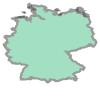

In [92]:
from src.functionality_maps import f_maps
from src.functionality_maps import paths

# Load germany geojson polygon
gdf_world = f_maps.load_gdf_from_csv(path=paths.path_wca)

GER = gdf_world[gdf_world['ADMIN'] == 'Germany']
ger_geo = GER['geometry'].values[0]
print(type(ger_geo))
ger_geo

### Get Germany region poligons

In [156]:
pdf_d1 = f_maps.load_gdf_from_csv(path=paths.csv[paths.l_d_dropdown_map[1]])
pdf_d2 = f_maps.load_gdf_from_csv(path=paths.csv[paths.l_d_dropdown_map[2]])
pdf_d3 = f_maps.load_gdf_from_csv(path=paths.csv[paths.l_d_dropdown_map[3]])
pdf_d4 = f_maps.load_gdf_from_csv(path=paths.csv[paths.l_d_dropdown_map[4]])
pdf_zips = pdf_d4['postcode']  # For indexing

pdf_d1 = pdf_d1.replace({'Ã¼': 'ü', 'Ã¶':'ö', 'Ã¤':'ä', 'ÃŸ':'ß'}, regex=True) 
pdf_d2 = pdf_d2.replace({'Ã¼': 'ü', 'Ã¶':'ö', 'Ã¤':'ä', 'ÃŸ':'ß'}, regex=True) 
pdf_d3 = pdf_d3.replace({'Ã¼': 'ü', 'Ã¶':'ö', 'Ã¤':'ä', 'ÃŸ':'ß'}, regex=True) 
pdf_d4 = pdf_d4.replace({'Ã¼': 'ü', 'Ã¶':'ö', 'Ã¤':'ä', 'ÃŸ':'ß'}, regex=True) 
pdf_d3.head()

,geometry,ID_0,ISO,NAME_0,ID_1,NAME_1,ID_2,NAME_2,ID_3,NAME_3,NL_NAME_3,VARNAME_3,TYPE_3,ENGTYPE_3
0,"POLYGON ((8.65348 53.11003, 8.66599 53.10659, ...",86,DEU,Germany,9,Niedersachsen,23,Weser-Ems,244,Oldenburg,NaN,NaN,Landkreise,Rural district
1,"POLYGON ((7.96379 52.32545, 7.9696 52.32937, 7...",86,DEU,Germany,9,Niedersachsen,23,Weser-Ems,245,Osnabrück Städte,NaN,NaN,Kreisfreie Städte,Urban district
2,"POLYGON ((8.02655 52.68435, 8.0391 52.67371, 8...",86,DEU,Germany,9,Niedersachsen,23,Weser-Ems,246,Osnabrück,NaN,NaN,Landkreise,Rural district
3,"POLYGON ((8.46214 52.80015, 8.45627 52.79629, ...",86,DEU,Germany,9,Niedersachsen,23,Weser-Ems,247,Vechta,NaN,NaN,Landkreise,Rural district
4,"MULTIPOLYGON (((8.3075 53.61819, 8.3075 53.617...",86,DEU,Germany,9,Niedersachsen,23,Weser-Ems,248,Wesermarsch,NaN,NaN,Landkreise,Rural district


In [150]:
pdf_all_stores = pd.concat([pdf_sportscheck, pdf_decathlon, pdf_intersport], axis=0, ignore_index=True)
pdf_all_stores['point'] = pdf_all_stores.apply(lambda row: Point(row['lon'], row['lat']), axis=1)
pdf_all_stores.columns

Index(['url', 'name', 'active', 'address', 'location', 'lat', 'lon', 'rect',
       'marker', 'fg', 'store', 'point'],
      dtype='object')

In [147]:
pdf_d4.head(1)

,geometry,postcode,locality
0,"POLYGON ((5.96845 51.04802, 5.96844 51.04793, ...",52538,"Gangelt, Selfkant"


In [151]:
# Convert to dictionary with keys from 'key' column and values from 'value' column
dict_ger_d1 = pdf_d1.set_index('name')['geometry'].to_dict()
dict_ger_d2 = pdf_d2.set_index('NAME_2')['geometry'].to_dict()
dict_ger_d3 = pdf_d3.set_index('NAME_3')['geometry'].to_dict()
# dict_ger_d4 = pdf_d4.set_index('name')['geometry'].to_dict()

adm_level = [1,2,3]
dict_adm  = [dict_ger_d1, dict_ger_d2, dict_ger_d3]

In [153]:
for level,dict_level in zip(adm_level,dict_adm):
    print(f'level={level}')
    print()
    for i,(entity,poly_state) in enumerate(dict_level.items()):
        print(f'[{i}/{len(dict_ger_d1)}] Entity= {entity}' )
        # print(f'   poly_state={poly_state}')

        pdf_all_stores[f'GADM_{level}_bool'] = pdf_all_stores['point'].apply(lambda point: poly_state.contains(point))
        pdf_all_stores.loc[pdf_all_stores[f'GADM_{level}_bool']==True, f'GADM_{level}'] = entity
    pdf_all_stores = pdf_all_stores.drop(f'GADM_{level}_bool', axis=1)



level=1

[0/16] Entity= Baden-Württemberg
   poly_state=MULTIPOLYGON (((8.708373069763297 47.71555709838867, 8.709177970886287 47.71345901489258, 8.710095405578784 47.71168518066429, 8.710541725158635 47.70994949340832, 8.710783958435115 47.70932006835932, 8.711812019348315 47.708053588867415, 8.712482452392862 47.70676803588867, 8.71268272399908 47.706062316894645, 8.713107109069824 47.70349121093756, 8.713713645935172 47.70177841186518, 8.714071273803825 47.70119094848661, 8.714656829833984 47.70074081420921, 8.716436386108398 47.70008850097662, 8.717366218566895 47.69956207275402, 8.718731880188386 47.69891357421881, 8.72245121002237 47.69652938842779, 8.7200489044194 47.69539642333979, 8.718537330627555 47.69483947753923, 8.716060638427791 47.69426727294939, 8.714508056640739 47.69411849975597, 8.712933540344181 47.694126129150504, 8.711398124694824 47.69427871704107, 8.708103179931754 47.6949157714846, 8.706265449524267 47.69557952880854, 8.70395755767845 47.69588088989275, 8.7035

In [155]:
pdf_all_stores

,url,name,active,address,location,lat,lon,rect,marker,fg,store,point,GADM_1,GADM_2,GADM_3
0,https://www.sportscheck.com/filialen/aachen/,aachen,True,"Aquis Plaza Adalbertstraße 100, 52062 Aachen","(Aquis Plaza, 100, Adalbertstraße, Kaiserplatz...",50.77473085,6.093145491143544,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B2390A7F80>,<folium.map.FeatureGroup object at 0x000002B23...,sportscheck,POINT (6.093145491143544 50.77473085),Nordrhein-Westfalen,KÃ¶ln,Aachen StÃ¤dte
1,https://www.sportscheck.com/filialen/berlin-sc...,berlin-schoeneberg,True,"Tauentzienstraße 5, 10789 Berlin","(5, Tauentzienstraße, Schöneberg, Tempelhof-Sc...",52.502939350000005,13.340930029655876,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B2390A7290>,<folium.map.FeatureGroup object at 0x000002B23...,sportscheck,POINT (13.340930029655876 52.502939350000005),Berlin,Berlin,Berlin
2,https://www.sportscheck.com/filialen/berlin-st...,berlin-steglitz,True,"Schloßstraße 7-10, 12163 Berlin","(HD Nails Kosmetik, 7-10, Schloßstraße, Stegli...",52.4626173,13.324295,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B23769FA70>,<folium.map.FeatureGroup object at 0x000002B23...,sportscheck,POINT (13.324295 52.4626173),Berlin,Berlin,Berlin
3,https://www.sportscheck.com/filialen/bielefeld/,bielefeld,True,"Bahnhofstraße 1, 33602 Bielefeld","(1, Bahnhofstraße, Bahnhofsviertel, Mitte, Bie...",52.02351535,8.532407675224173,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B23769F800>,<folium.map.FeatureGroup object at 0x000002B23...,sportscheck,POINT (8.532407675224173 52.02351535),Nordrhein-Westfalen,Detmold,Bielefeld StÃ¤dte
4,https://www.sportscheck.com/filialen/bonn/,bonn,True,"Remigiussstraße 6-8, 53111 Bonn",NaN,NaN,NaN,NaN,NaN,NaN,sportscheck,POINT EMPTY,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503,https://www.intersport.de/d/stores/92224-amber...,92224-amberg-intersport-lange,NaN,"Marktplatz 1, 92224 Amberg","(1, Marktplatz, Amberg, Bayern, 92224, Deutsch...",49.44503465,11.858539550000003,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B23783F5C0>,<folium.map.FeatureGroup object at 0x000002B23...,intersport,POINT (11.858539550000003 49.44503465),Bayern,Oberpfalz,Amberg StÃ¤dte
504,https://www.intersport.de/d/stores/95447-bayre...,95447-bayreuth-intersport-giessuebel,NaN,"Otto-Hahn-Strasse 1, 95447 Bayreuth","(EDEKA, 1, Otto-Hahn-Straße, Gewerbegebiet Alt...",49.931761449999996,11.565170261674503,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B23783DBE0>,<folium.map.FeatureGroup object at 0x000002B23...,intersport,POINT (11.565170261674503 49.931761449999996),Bayern,Oberfranken,Bayreuth StÃ¤dte
505,https://www.intersport.de/d/stores/92431-neunb...,92431-neunburg-vorm-wald-intersport-meier,NaN,"Vorstadt 5, 92431 Neunburg vorm Wald","(5, Vorstadt, Katzdorf, Neunburg vorm Wald, La...",49.3483601,12.3813983,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B23783FC50>,<folium.map.FeatureGroup object at 0x000002B23...,intersport,POINT (12.3813983 49.3483601),Bayern,Oberpfalz,Schwandorf
506,https://www.intersport.de/d/stores/97616-bad-n...,97616-bad-neustadt-intersport-pecht,NaN,"Siemensstrasse 4, 97616 Bad Neustadt","(Pecht Shoppingwelt - Haus 1, 4, Siemensstraße...",50.32752175,10.222465596841367,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B23783D8E0>,<folium.map.FeatureGroup object at 0x000002B23...,intersport,POINT (10.222465596841367 50.32752175),Bayern,Unterfranken,RhÃ¶n-Grabfeld


### `pdf_all_stores` contains the information about the stores and the GADM levels

In [163]:
pdf_bw = pdf_all_stores[pdf_all_stores['GADM_1'] == 'Baden-Württemberg']
# Filter out rows with missing geometries
pdf_bw_filtered = pdf_bw.dropna(subset=['point'])
pdf_bw_filtered

,url,name,active,address,location,lat,lon,rect,marker,fg,store,point,GADM_1,GADM_2,GADM_3
18,https://www.sportscheck.com/filialen/karlsruhe/,karlsruhe,True,"Kaiserstraße 92, 76133 Karlsruhe","(92, Kaiserstraße, Innenstadt-West Östlicher T...",49.0098201,8.401222,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B237C1A2D0>,<folium.map.FeatureGroup object at 0x000002B23...,sportscheck,POINT (8.401222 49.0098201),Baden-Württemberg,Karlsruhe,Karlsruhe StÃ¤dte
28,https://www.sportscheck.com/filialen/stuttgart/,stuttgart,True,"Kronenstraße 3, 70173 Stuttgart","(3, Kronenstraße, Hauptbahnhof, Stuttgart-Mitt...",48.781737,9.1804094,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B236FE3800>,<folium.map.FeatureGroup object at 0x000002B23...,sportscheck,POINT (9.1804094 48.781737),Baden-Württemberg,Stuttgart,Stuttgart StÃ¤dte
32,NaN,Karlsruhe-Durlach,NaN,"Durlacher Allee 111, Karlsruhe","(Saturn, 111, Durlacher Allee, Oststadt Südlic...",49.0048494,8.450612274220273,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B237302930>,<folium.map.FeatureGroup object at 0x000002B23...,decathlon,POINT (8.450612274220273 49.0048494),Baden-Württemberg,Karlsruhe,Karlsruhe StÃ¤dte
44,NaN,Ulm,NaN,"Blaubeurer Str. 95, Ulm","(95, Blaubeurer Straße, Söflingen, Ulm, Baden-...",48.4001894,9.9592603,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B237301100>,<folium.map.FeatureGroup object at 0x000002B23...,decathlon,POINT (9.9592603 48.4001894),Baden-Württemberg,TÃ¼bingen,Ulm StÃ¤dte
45,NaN,Plochingen,NaN,"Filsallee 19, Plochingen","(Decathlon Plochingen, 19, Filsallee, Ploching...",48.7026898,9.437392619846309,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B236826330>,<folium.map.FeatureGroup object at 0x000002B23...,decathlon,POINT (9.437392619846309 48.7026898),Baden-Württemberg,Stuttgart,Esslingen
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
460,https://www.intersport.de/d/stores/88630-pfull...,88630-pfullendorf-intersport-marco,NaN,"Bergwaldstrasse 4, 88630 Pfullendorf","(4, Bergwaldstraße, Pfullendorf-Stadt, Pfullen...",47.92285715,9.253617684220217,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B237415BE0>,<folium.map.FeatureGroup object at 0x000002B23...,intersport,POINT (9.253617684220217 47.92285715),Baden-Württemberg,TÃ¼bingen,Sigmaringen
466,https://www.intersport.de/d/stores/88250-weing...,88250-weingarten-intersport-grimm,NaN,"Karlstrasse 6, 88250 Weingarten","(6, Karlstraße, Weingarten, Verwaltungsverband...",47.80779225,9.640876375597461,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B237417A10>,<folium.map.FeatureGroup object at 0x000002B23...,intersport,POINT (9.640876375597461 47.80779225),Baden-Württemberg,TÃ¼bingen,Ravensburg
470,https://www.intersport.de/d/stores/89584-ehing...,89584-ehingen-intersport,NaN,"Talstrasse 12, 89584 Ehingen","(12, Talstraße, Alb-Donau-Center, Dettingen, E...",48.27073675,9.729941784727547,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B23774C0B0>,<folium.map.FeatureGroup object at 0x000002B23...,intersport,POINT (9.729941784727547 48.27073675),Baden-Württemberg,TÃ¼bingen,Alb-Donau
472,https://www.intersport.de/d/stores/89518-heide...,89518-heidenheim-intersport-voswinkel,NaN,"Karlstrasse 12, 89518 Heidenheim an der Brenz","(Karl-Olga-Apotheke, 12, Karlstraße, Innenstad...",48.6793043,10.1525245,<folium.vector_layers.Rectangle object at 0x00...,<folium.map.Marker object at 0x000002B237384CE0>,<folium.map.FeatureGroup object at 0x000002B23...,intersport,POINT (10.1525245 48.6793043),Baden-Württemberg,Stuttgart,Heidenheim


In [173]:
l_icons=['SportScheck', 'Decathlon', 'Intersport']
l_stores=['sportscheck', 'decathlon', 'intersport']
dict_stores[l_icons[0]]['logo']

'assets/SportScheck/1_Home/logo.png'


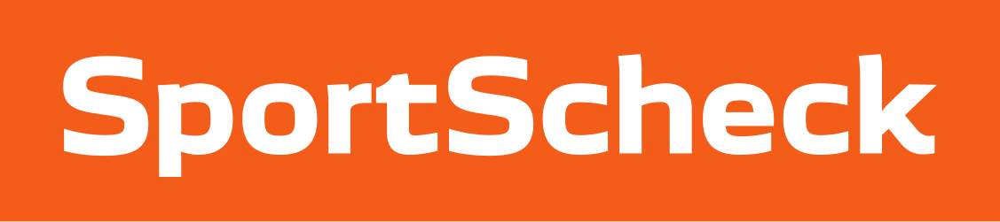
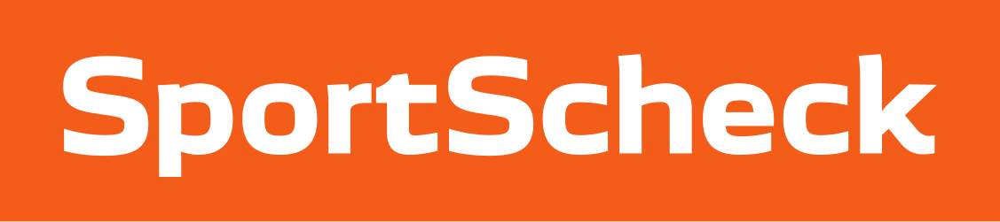
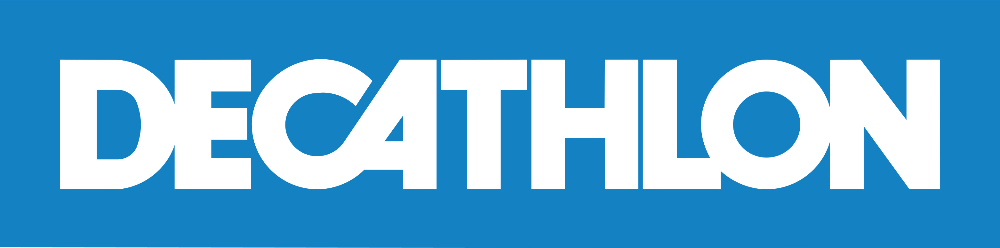
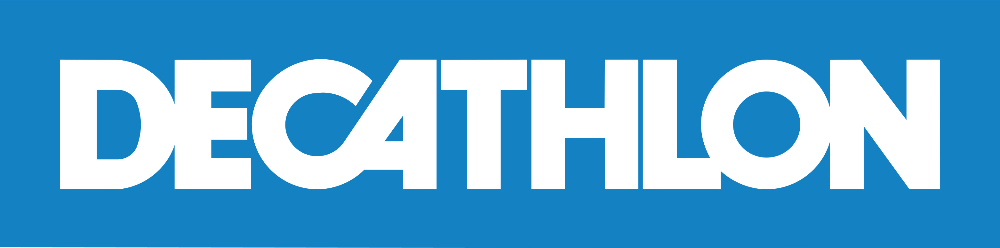
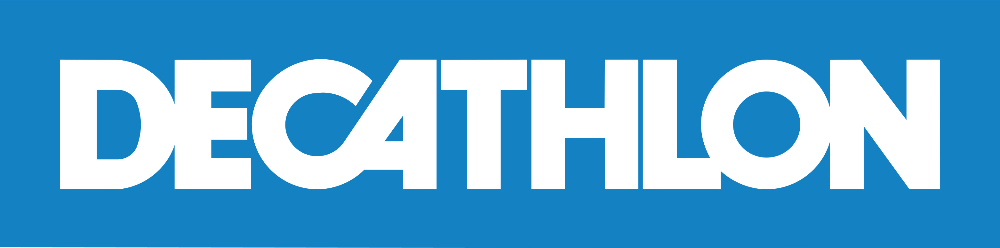
...
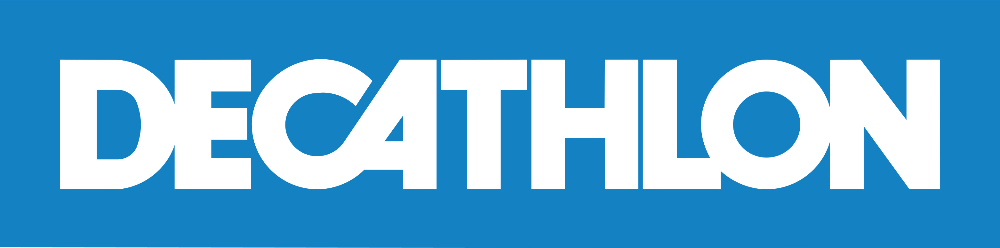
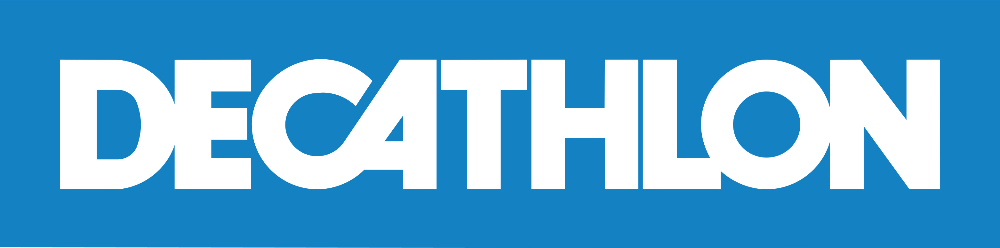
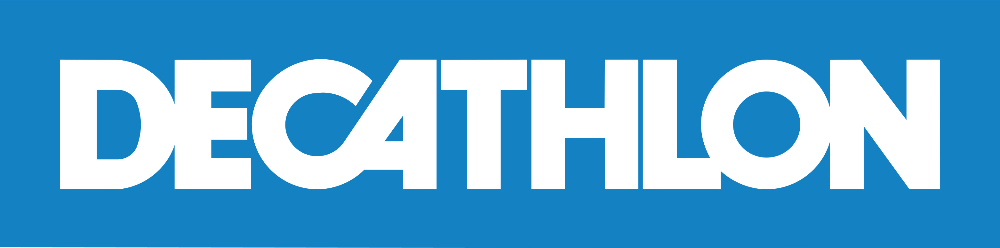
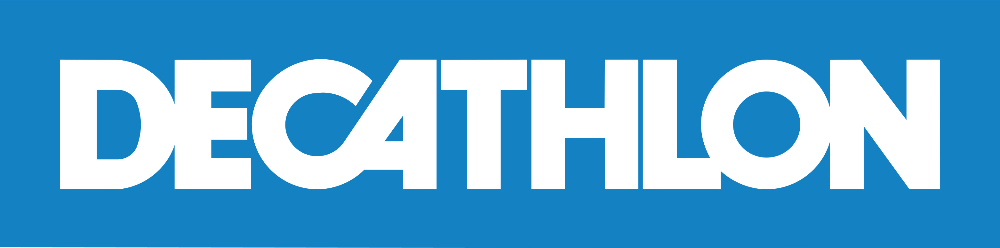
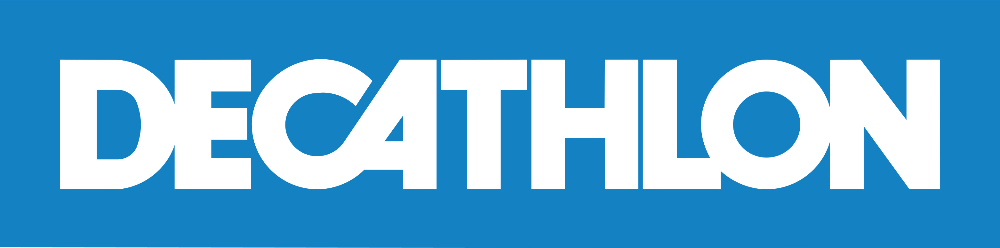

In [175]:
fm = folium.Map()

for store,store_icon in zip(l_stores,l_icons):
    pdfs = pdf_bw_filtered[pdf_bw_filtered['store'] == store]
    fg = folium.FeatureGroup(name=f'{store}[{len(pdfs)}]')
    # Add markers to the map for each point in the DataFrame
    for idx, row in pdfs.iterrows():
        folium.Marker(
            location=[row['lat'], row['lon']],
            popup=row['name'],
            icon=folium.features.CustomIcon(icon_image=dict_stores[store_icon]['logo'],
                                                              icon_size=(50, 15)
                                                             )
        ).add_to(fg)
    # Add the FeatureGroup to the map
    fg.add_to(fm)
    
fullscreen = folium.plugins.Fullscreen(position='topleft',
                                            title='Expand me',
                                            title_cancel='Exit me',
                                            force_separate_button=True)
fm.add_child(fullscreen)
layercontrol = folium.LayerControl(position='topright',
                                    collapsed=False)
fm = fm.add_child(layercontrol)
fm.fit_bounds(fm.get_bounds())
fm

In [ ]:

fm = folium.Map()
# for i,(store_name,dict_store_info) in enumerate(dict_sales.items()):
#     print(f'[{i}/{len(dict_sales)}] Processing store [{store_name}]')
#     l_fg_store = folium.FeatureGroup(name=f'Store={store_name} [{len(dict_store_info)}]')

#     for store_id, store_info in dict_store_info.items():
#         if 'fg' in store_info:
#             l_fg_store.add_child(store_info['rect'])
#             l_fg_store.add_child(store_info['marker'])
#     fm.add_child(l_fg_store)
#     print(f'Store [{store_name}] added to map!')

fullscreen = folium.plugins.Fullscreen(position='topleft',
                                            title='Expand me',
                                            title_cancel='Exit me',
                                            force_separate_button=True)
fm.add_child(fullscreen)
layercontrol = folium.LayerControl(position='topright',
                                    collapsed=False)
fm = fm.add_child(layercontrol)
fm.fit_bounds(fm.get_bounds())